In [1]:
from __future__ import absolute_import
# though cupy is not used but without this line, it raise errors...
import cupy as cp
import os
import numpy as np

import ipdb
import matplotlib
from tqdm import tqdm

from utils.config import opt
from data.dataset import Dataset, TestDataset, inverse_normalize
from model.point_linking_inceptionresnetv2 import PointLinkInception

from torch.utils import data as data_
from trainer import PointLinkTrainer
from utils import array_tool as at
from utils.vis_tool import visdom_bbox, vis_image
from utils.eval_tool import eval_detection_voc

# fix for ulimit
# https://github.com/pytorch/pytorch/issues/973#issuecomment-346405667
import resource

rlimit = resource.getrlimit(resource.RLIMIT_NOFILE)
resource.setrlimit(resource.RLIMIT_NOFILE, (20480, rlimit[1]))

matplotlib.use('agg')

In [2]:
kwargs = {'plot_every': 1, 'env': 'visual_predict'}
opt._parse(kwargs)
print("======!!========")
print(kwargs)
dataset = Dataset(opt)
print('load data')
dataloader = data_.DataLoader(dataset, \
                              batch_size=1, \
                              shuffle=True, \
                              # pin_memory=True,
                              num_workers=opt.num_workers)
print('load test data')
testset = TestDataset(opt)
test_dataloader = data_.DataLoader(testset,
                                   batch_size=1,
                                   num_workers=opt.test_num_workers,
                                   shuffle=False, \
                                   pin_memory=True
                                   )
point_link = PointLinkInception()
print('model construct completed')
trainer = PointLinkTrainer(point_link).cuda()
trainer.load("/data/yy/github/point-linking-network/checkpoints/pointlink_07071924_0.0")
#print(opt.load_path)
#trainer.load(opt.load_path)
print('load pretrained model from %s' % opt.load_path)
best_map = 0

======user config========
{'caffe_pretrain': False,
 'data': 'voc',
 'debug_file': '/tmp/debugf',
 'env': 'visual_predict',
 'epoch': 14,
 'load_path': None,
 'lr': 0.0001,
 'lr_decay': 0.1,
 'max_size': 448,
 'min_size': 448,
 'num_workers': 2,
 'plot_every': 1,
 'port': 2333,
 'pretrain_path': 'checkpoints/inceptionresnetv2.pth',
 'pretrained_model': 'inceptionresnetv2',
 'roi_sigma': 1.0,
 'rpn_sigma': 3.0,
 'test_num': 2,
 'test_num_workers': 8,
 'use_RMSprop': True,
 'use_adam': False,
 'use_chainer': False,
 'use_drop': False,
 'use_pretrain': True,
 'voc_data_dir': './VOCdevkit/VOC2007/',
 'weight_decay': 0.0005}
==========end============
======!!========
{'plot_every': 1, 'env': 'visual_predict'}
load data
load test data
train pretrained


/data/yy/anaconda3/envs/py3/lib/python3.7/site-packages/torch/nn/_reduction.py:46: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


model construct completed
load model
load pretrained model from None


In [3]:
def eval(dataloader, point_link, test_num=1000, threshold=1e-07):
    pred_bboxes, pred_labels, pred_scores = list(), list(), list()
    gt_bboxes, gt_labels, gt_difficults = list(), list(), list()
    for ii, (imgs, sizes, gt_bboxes_, gt_labels_, gt_difficults_) in tqdm(enumerate(dataloader)):
        sizes = [sizes[0][0].item(), sizes[1][0].item()]
        pred_bboxes_, pred_labels_, pred_scores_ = point_link.predict(imgs, [sizes], threshold)
        print("pred_bboxes_.shape", np.array(pred_bboxes_).shape)
        gt_bboxes += list(gt_bboxes_.numpy())
        gt_labels += list(gt_labels_.numpy())
        gt_difficults += list(gt_difficults_.numpy())
        pred_bboxes += pred_bboxes_
        pred_labels += pred_labels_
        pred_scores += pred_scores_
        if ii == test_num: break
    result = eval_detection_voc(
        pred_bboxes, pred_labels, pred_scores,
        gt_bboxes, gt_labels, gt_difficults,
        use_07_metric=True)
    return result

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['savefig.dpi'] = 300 #图片像素
plt.rcParams['figure.dpi'] = 300 #分辨率

load model
load pretrained model from None



0it [00:00, ?it/s]

(1, 0)


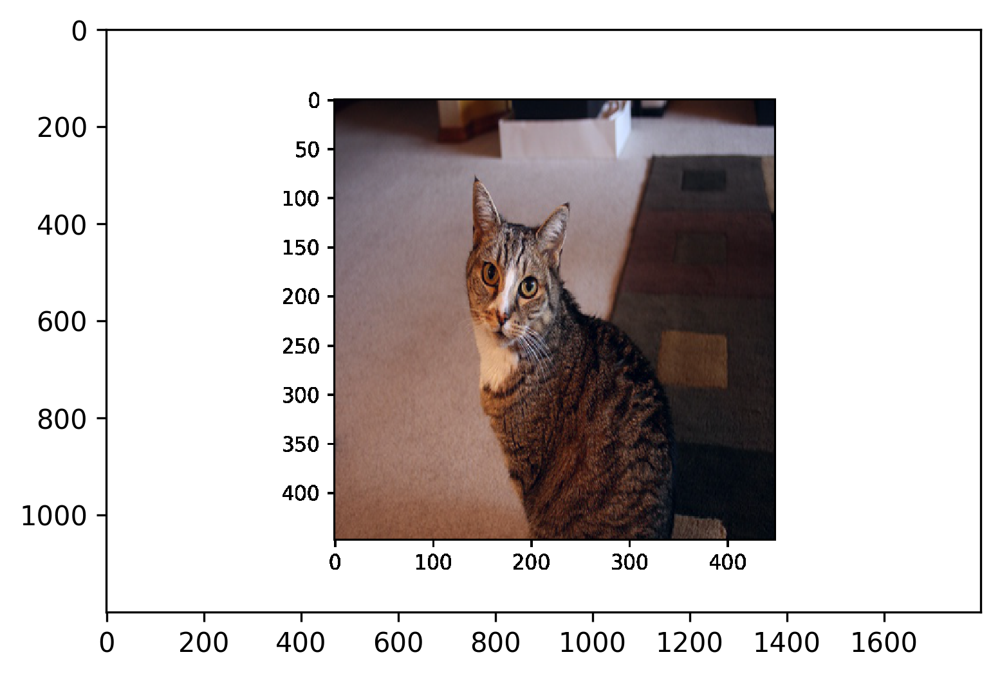


1it [00:29, 29.09s/it]

(1, 0)


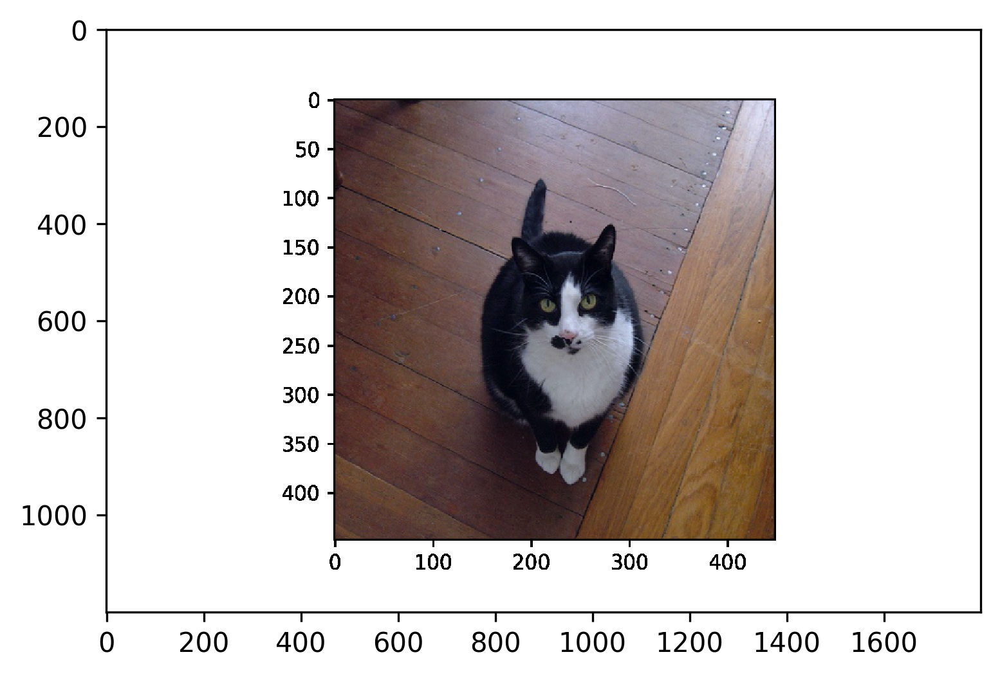


2it [00:57, 28.81s/it]

(1, 0)


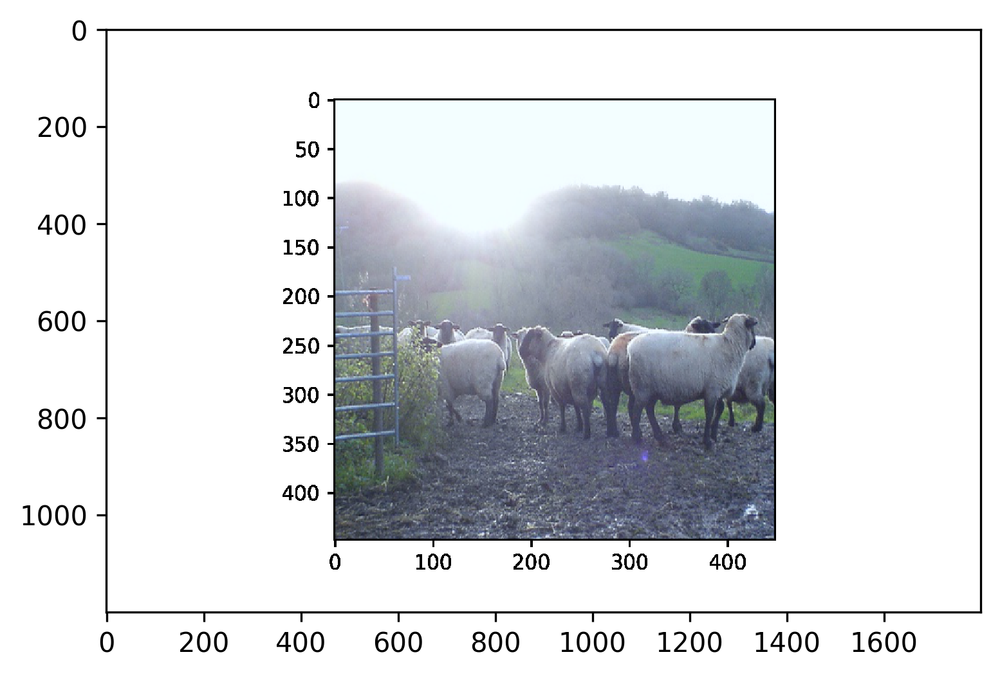


3it [01:25, 28.68s/it]

KeyboardInterrupt: 

In [6]:
trainer.load("/data/yy/github/point-linking-network/checkpoints/pointlink_07080510_0.0")
#print(opt.load_path)
#trainer.load(opt.load_path)
print('load pretrained model from %s' % opt.load_path)
best_map = 0
opt.plot_every == 1
for ii, (img, bbox_, label_, scale) in tqdm(enumerate(dataloader)):
    #print("label_", label_)
    scale = at.scalar(scale)
    img, bbox, label = img.cuda().float(), bbox_.cuda(), label_.cuda()
    
    if (ii + 1) % opt.plot_every == 0:
        if os.path.exists(opt.debug_file):
            ipdb.set_trace()

        # plot groud truth bboxes
        ori_img_ = inverse_normalize(at.tonumpy(img[0]))
        gt_img = visdom_bbox(ori_img_,
                             at.tonumpy(bbox_[0]),
                             at.tonumpy(label_[0]))
        trainer.vis.img('gt_img', gt_img)
        # plot predicti bboxes
        _bboxes, _labels, _scores = trainer.point_link.predict([ori_img_], visualize=True)
        print(np.array(_bboxes).shape)
        if _bboxes is not None:
            pred_img = visdom_bbox(ori_img_,
                               at.tonumpy(_bboxes[0]),
                               at.tonumpy(_labels[0]),
                               at.tonumpy(_scores[0]))
        else:
            pred_img = vis_image(ori_img_)
        plt.imshow(pred_img.transpose(1,2,0))
        plt.show()

load model




0it [00:00, ?it/s]

(1, 18, 4)


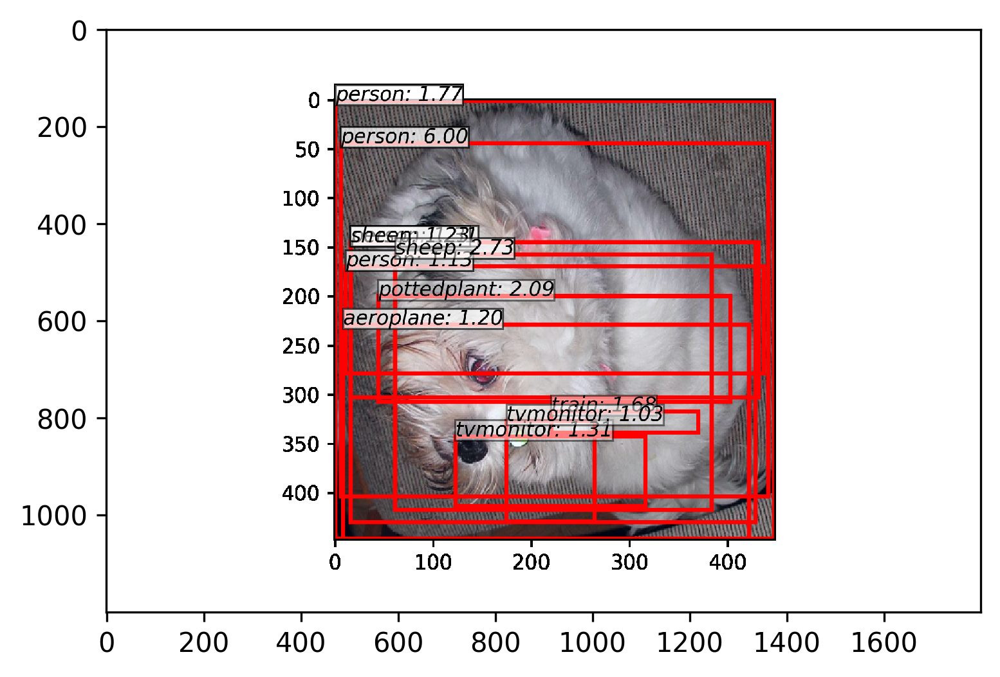



1it [00:27, 27.90s/it]

(1, 16, 4)


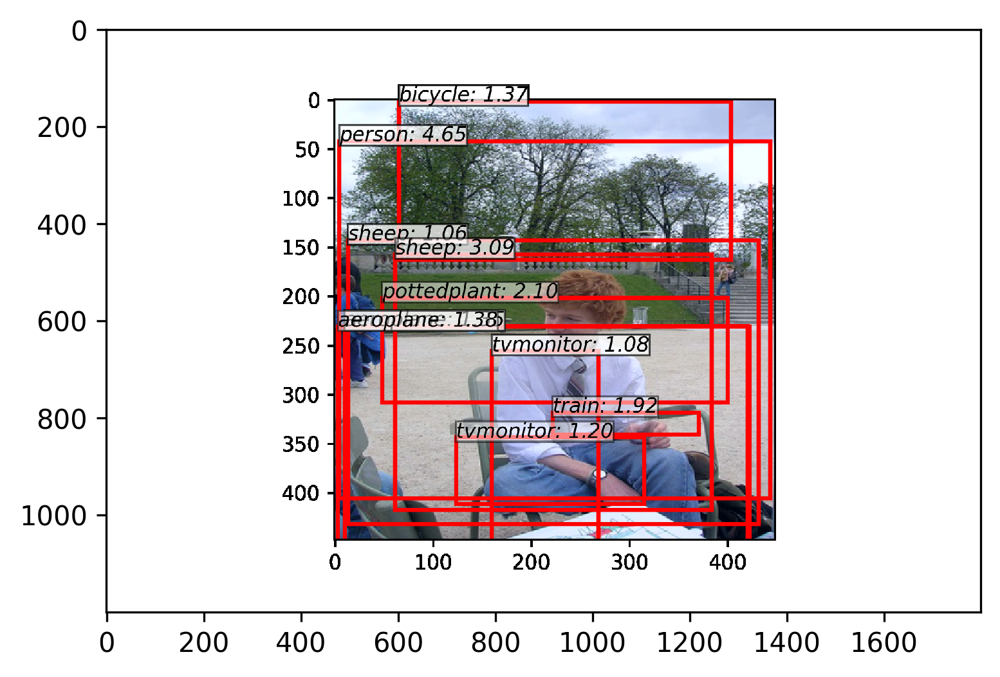



2it [00:54, 27.59s/it]

(1, 10, 4)


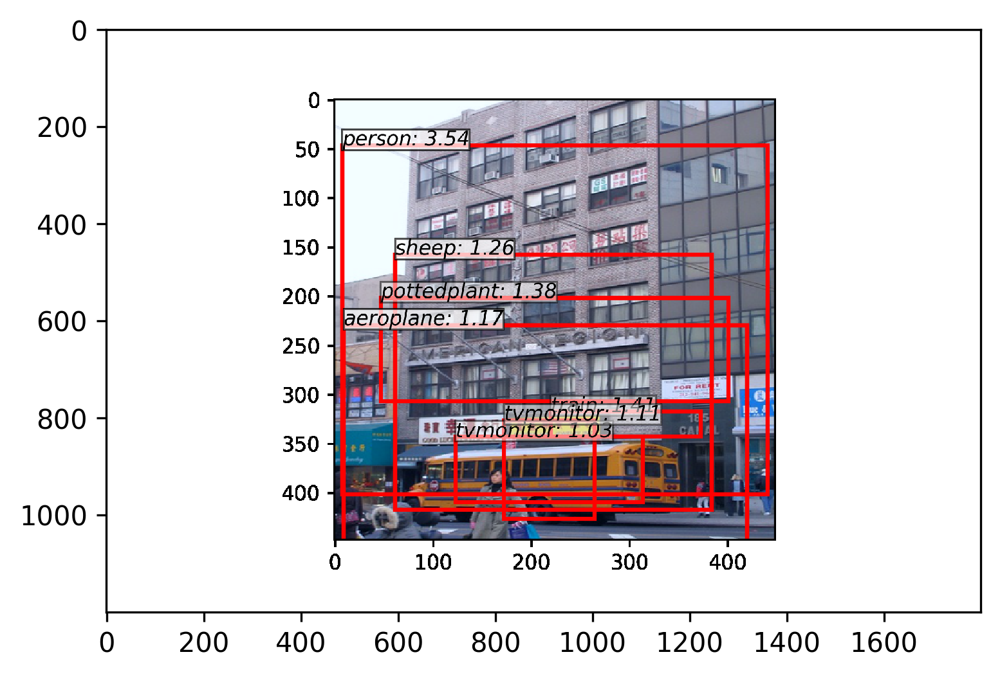



3it [01:23, 27.78s/it]

(1, 10, 4)


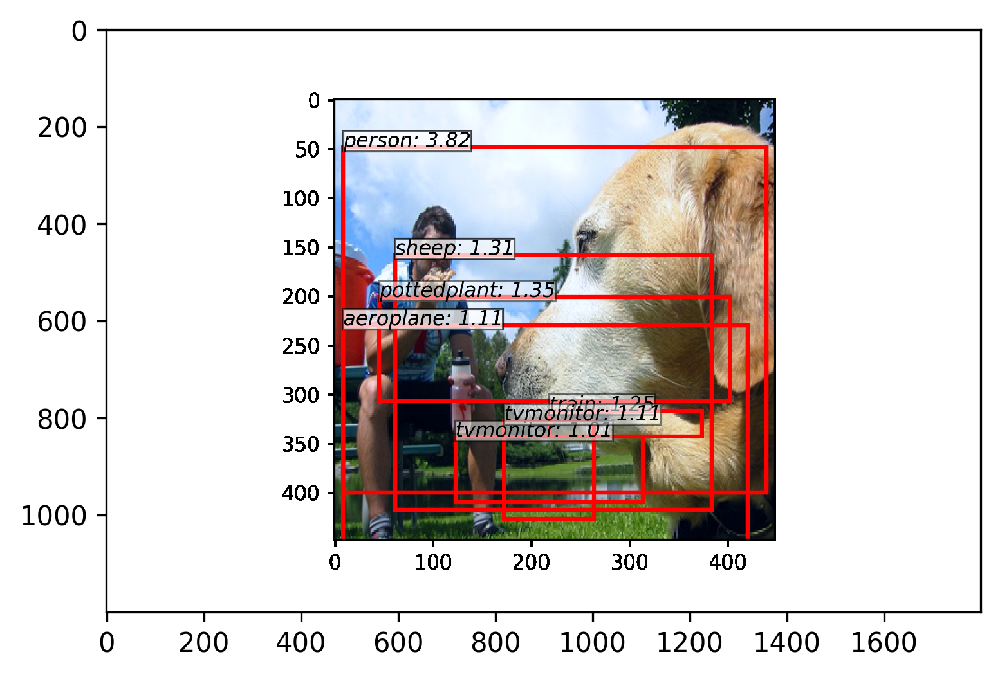



4it [01:51, 28.12s/it]

(1, 11, 4)


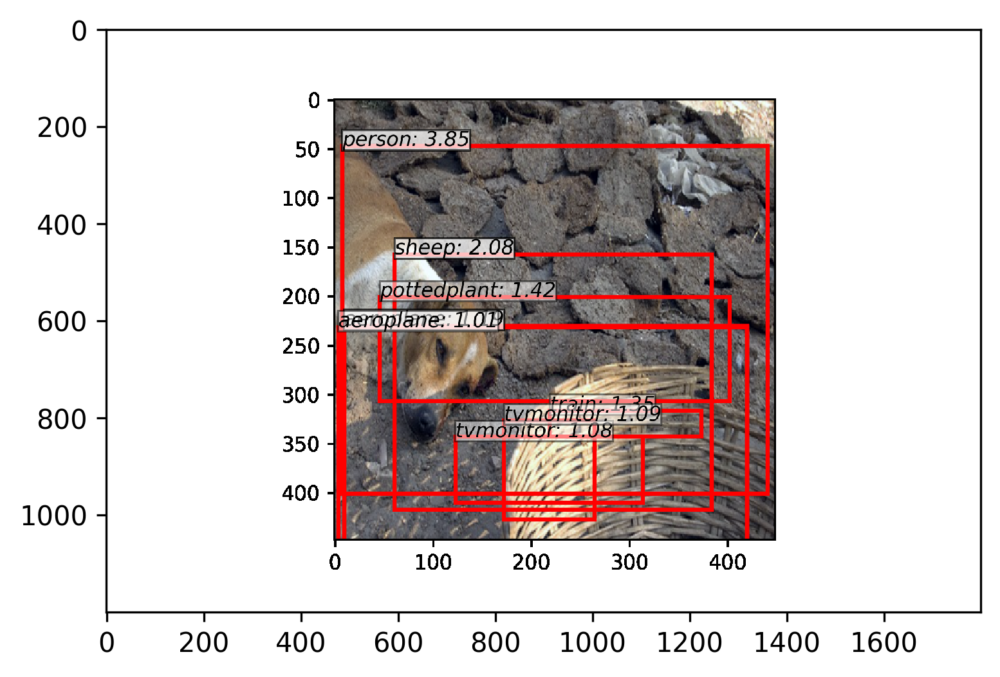



5it [02:21, 28.71s/it]

(1, 7, 4)


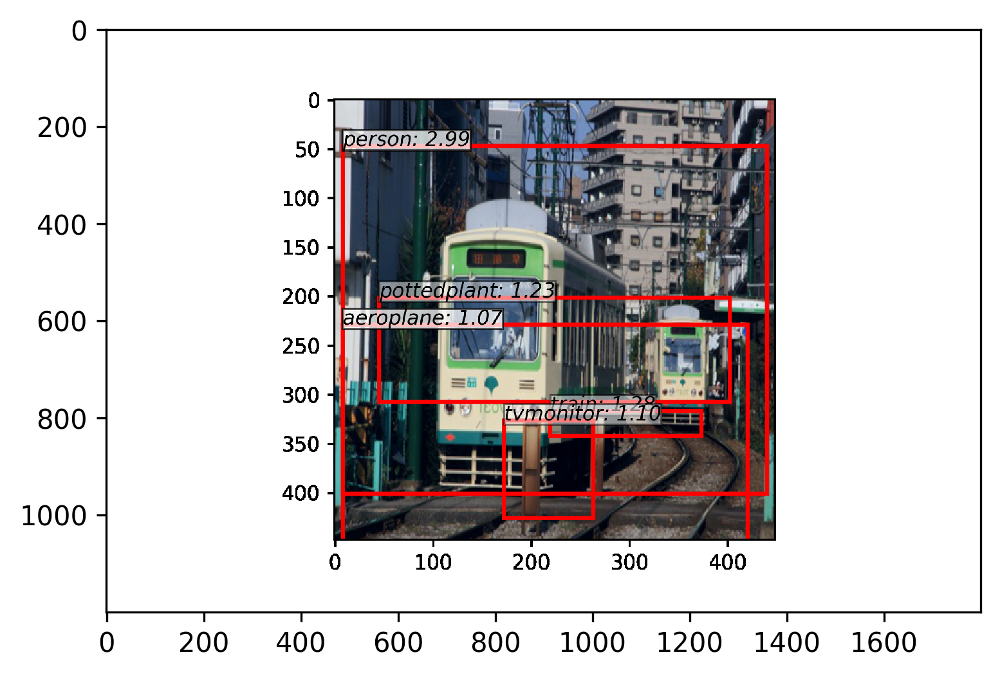



6it [02:53, 29.57s/it]

(1, 12, 4)


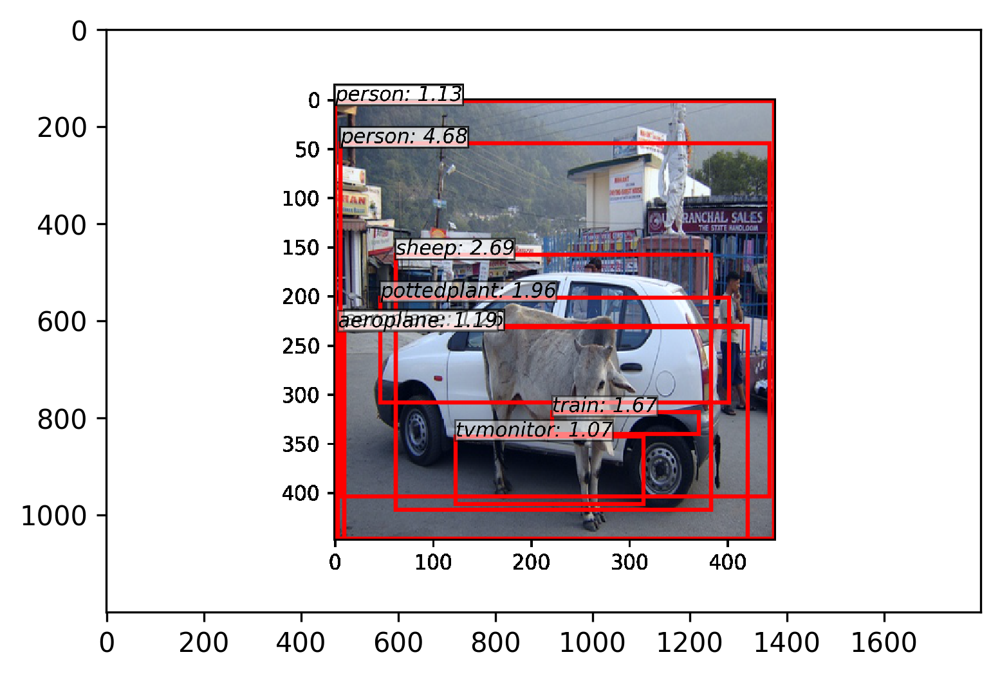



7it [03:23, 29.64s/it]

(1, 18, 4)


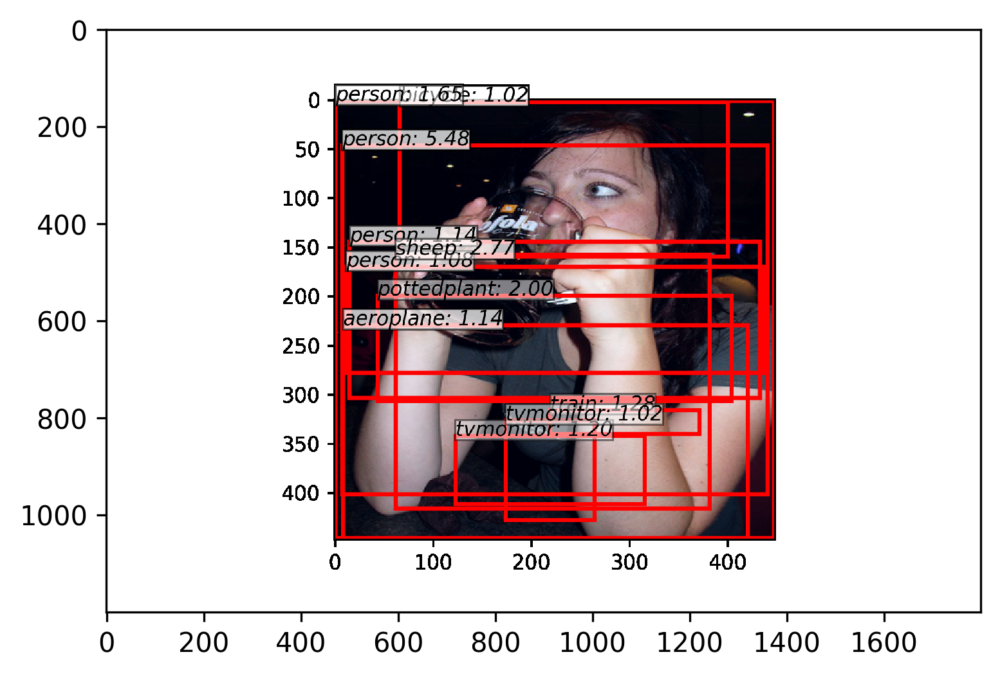



8it [03:53, 29.70s/it]

(1, 6, 4)


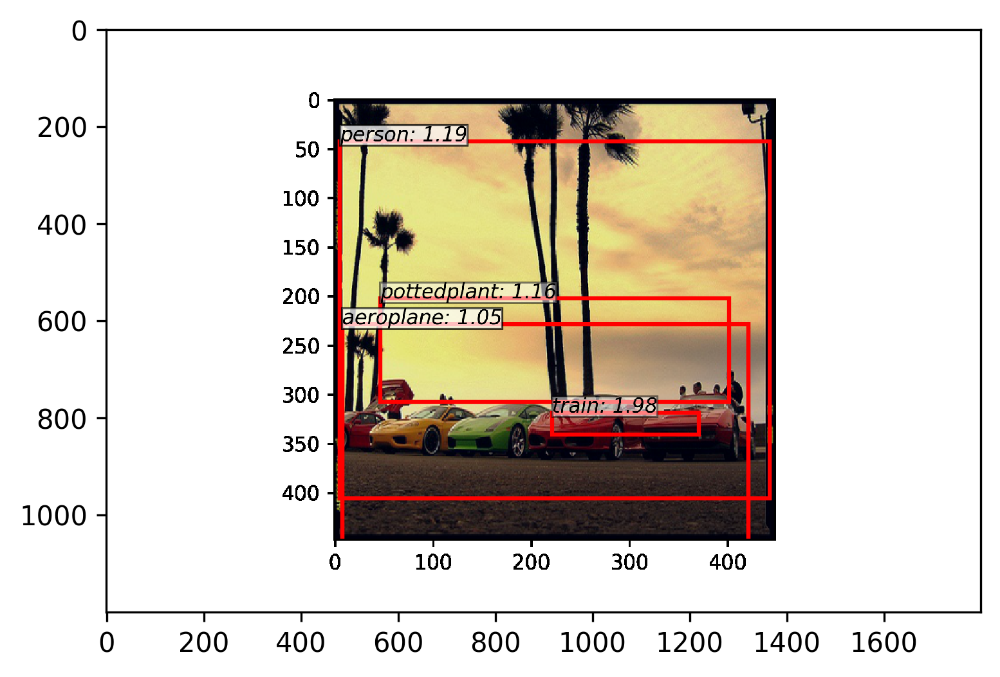



9it [04:23, 29.99s/it]

(1, 18, 4)


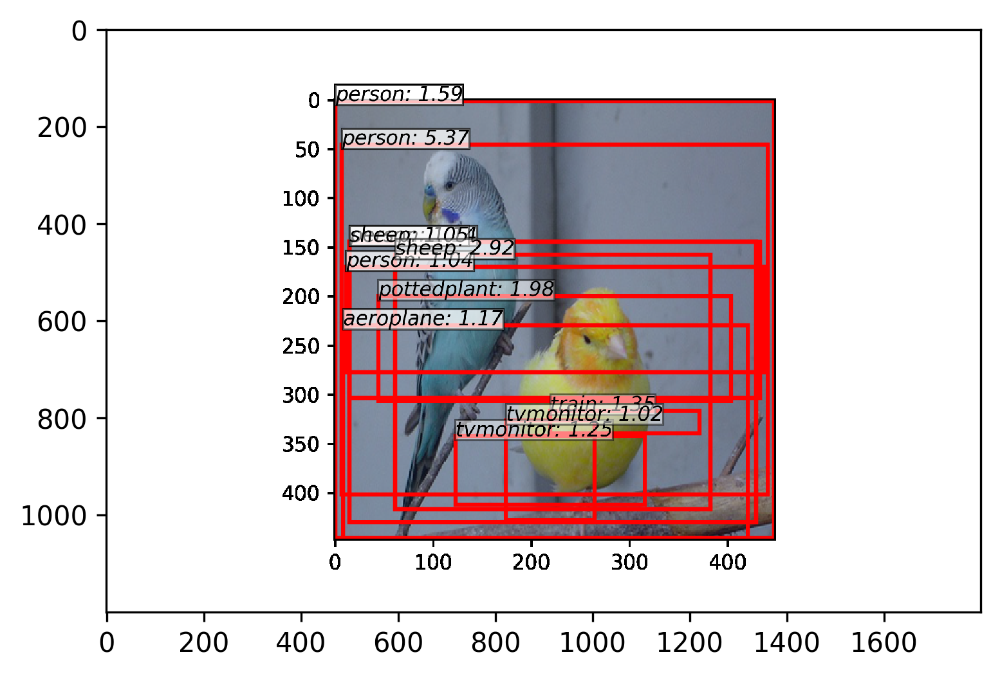



10it [04:53, 29.89s/it]

(1, 16, 4)


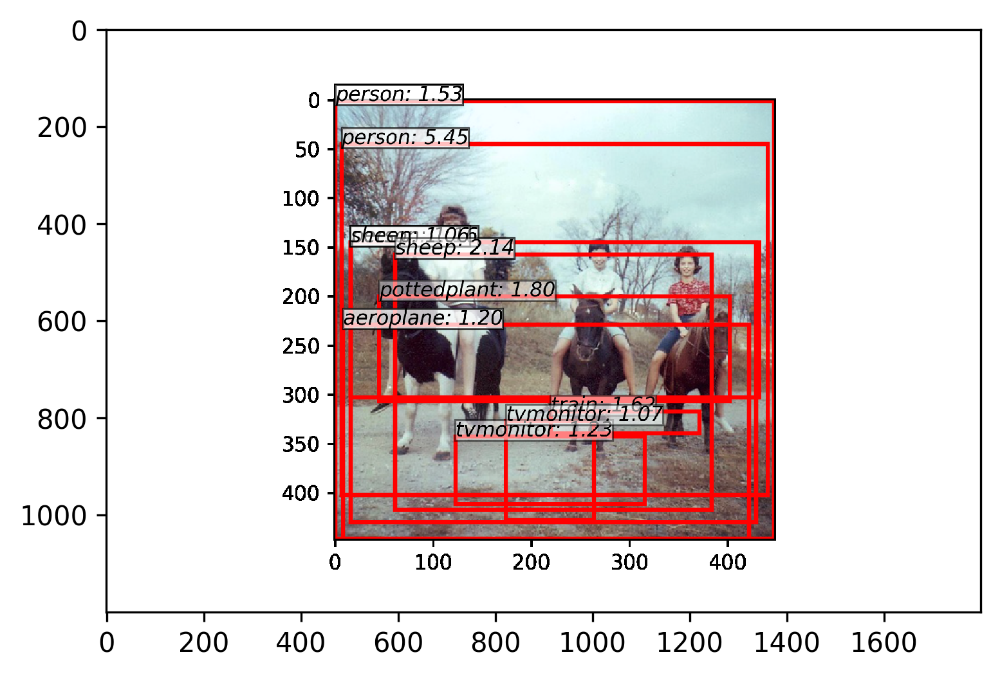



11it [05:22, 29.66s/it]

(1, 14, 4)


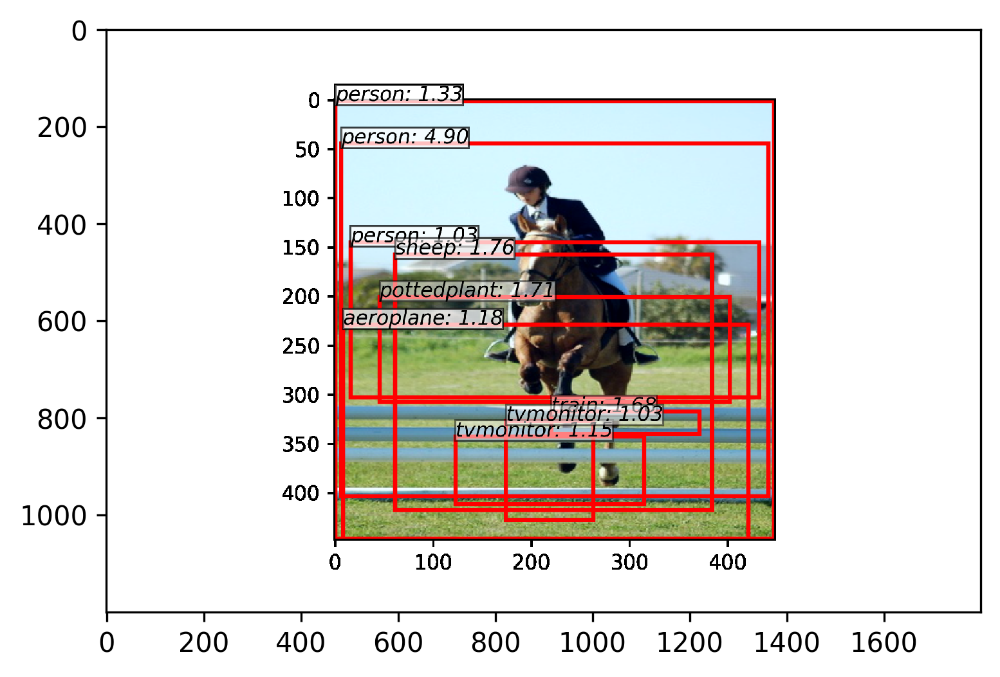



12it [05:51, 29.45s/it]

(1, 6, 4)


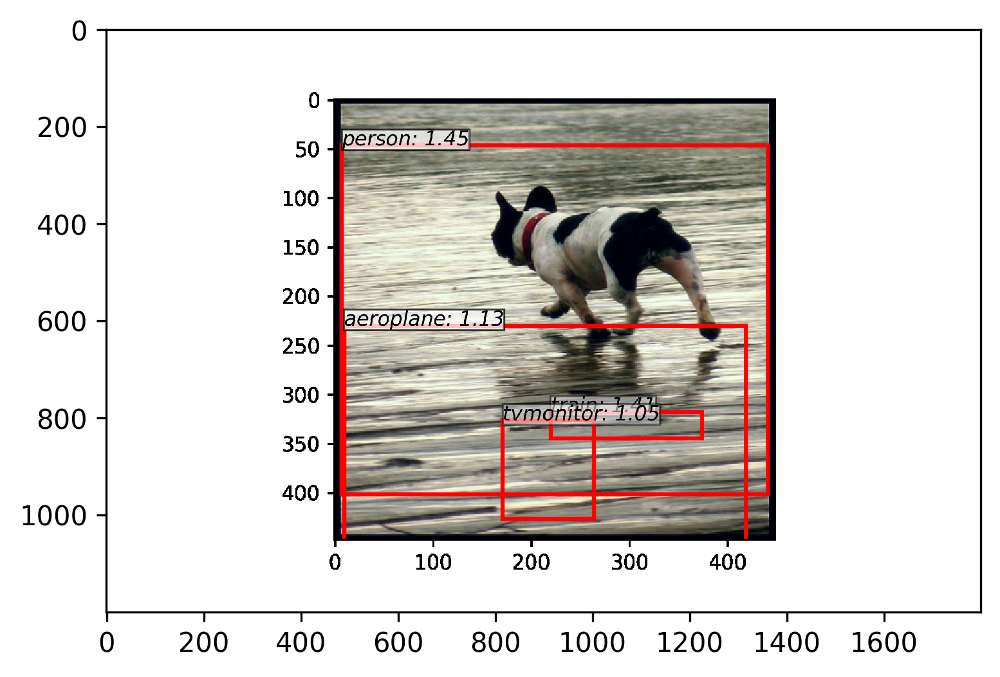



13it [06:24, 30.53s/it]

(1, 16, 4)


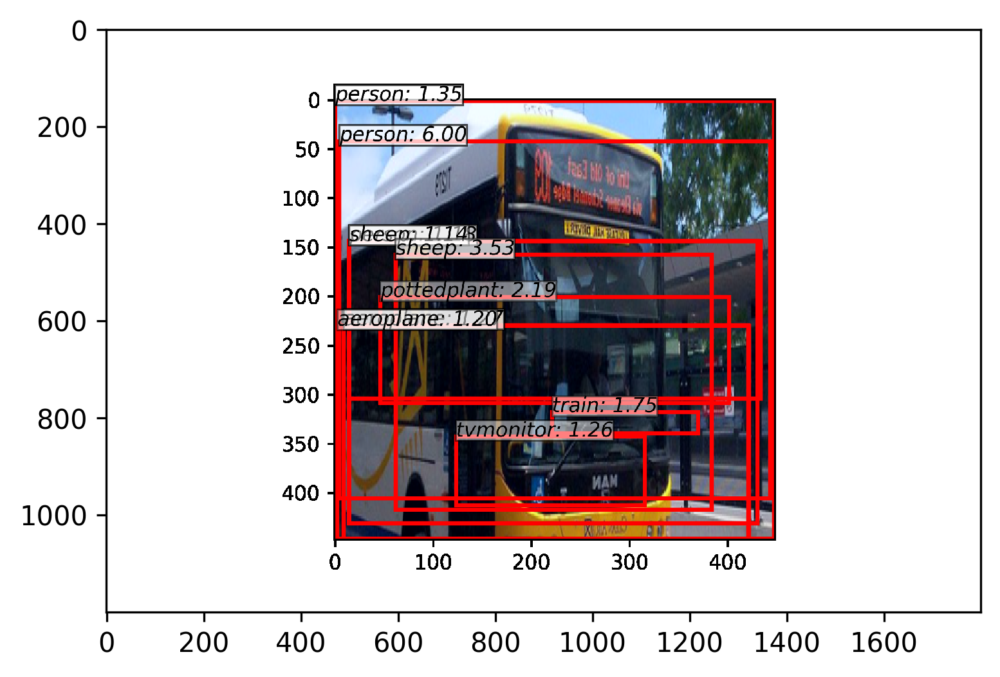



14it [06:52, 29.77s/it]

(1, 19, 4)


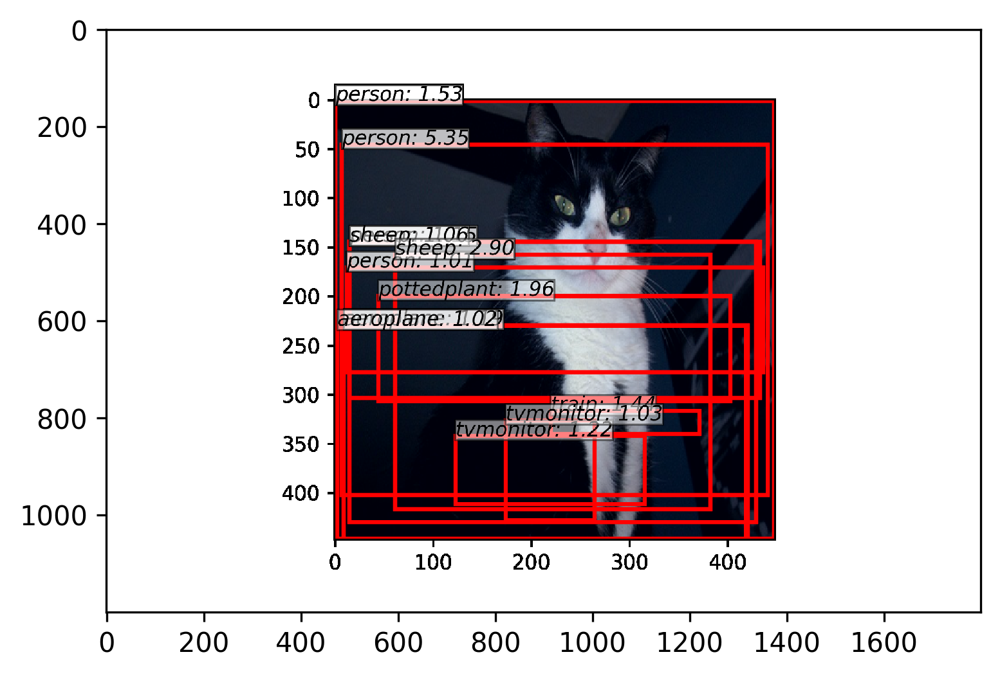



15it [07:22, 29.71s/it]

(1, 14, 4)


In [ ]:
trainer.load("/data/yy/github/point-linking-network/checkpoints/pointlink_07071444_0.0")
opt.plot_every == 1
for ii, (img, bbox_, label_, scale) in tqdm(enumerate(dataloader)):
    #print("label_", label_)
    scale = at.scalar(scale)
    img, bbox, label = img.cuda().float(), bbox_.cuda(), label_.cuda()
    
    if (ii + 1) % opt.plot_every == 0:
        if os.path.exists(opt.debug_file):
            ipdb.set_trace()

        # plot groud truth bboxes
        ori_img_ = inverse_normalize(at.tonumpy(img[0]))
        gt_img = visdom_bbox(ori_img_,
                             at.tonumpy(bbox_[0]),
                             at.tonumpy(label_[0]))
        trainer.vis.img('gt_img', gt_img)
        # plot predicti bboxes
        _bboxes, _labels, _scores = trainer.point_link.predict([ori_img_], visualize=True)
        print(np.array(_bboxes).shape)
        if _bboxes is not None:
            pred_img = visdom_bbox(ori_img_,
                               at.tonumpy(_bboxes[0]),
                               at.tonumpy(_labels[0]),
                               at.tonumpy(_scores[0]))
        else:
            pred_img = vis_image(ori_img_)
        plt.imshow(pred_img.transpose(1,2,0))
        plt.show()

In [ ]:
eval_result = eval(test_dataloader, point_link, test_num=5)
print(eval_result['map'])

In [ ]:
import torch as t



In [ ]:
a = t.tensor(0.9823e-07)
if a > 1e-07:
    print("1")
else:
    print("0")